# Temperature Forecast Project using ML


Project Description
This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

Attribute Information:
For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

You have to build separate models that can predict the minimum temperature for the next day 
and the maximum temperature for the next day based on the details provided in the dataset.

Dataset Link-

https://github.com/dsrscientist/Dataset2/blob/main/temperature.csv


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('temperature.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


we need to build two seprate models 
1. for minimum temperature for next day 
2. for maximum temperature for next day

In [3]:
df.shape

(7752, 25)

In [4]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [5]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [6]:
df.Next_Tmax.value_counts()

29.3    113
33.0    106
31.3    104
29.6    101
31.2     98
       ... 
37.9      1
38.3      1
37.6      1
37.4      1
21.5      1
Name: Next_Tmax, Length: 183, dtype: int64

In [7]:
df.Next_Tmin.value_counts()

23.5    159
23.4    157
24.0    156
23.2    150
23.8    149
       ... 
13.4      1
13.3      1
28.2      1
29.5      1
12.9      1
Name: Next_Tmin, Length: 157, dtype: int64

In [8]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [9]:
df.duplicated().sum()

0

# Removing null values

In [10]:
df=df.fillna(0)

In [11]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [12]:
# Drop columns
df = df.drop(['station','Date'],axis = 1)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Present_Tmax      7752 non-null   float64
 1   Present_Tmin      7752 non-null   float64
 2   LDAPS_RHmin       7752 non-null   float64
 3   LDAPS_RHmax       7752 non-null   float64
 4   LDAPS_Tmax_lapse  7752 non-null   float64
 5   LDAPS_Tmin_lapse  7752 non-null   float64
 6   LDAPS_WS          7752 non-null   float64
 7   LDAPS_LH          7752 non-null   float64
 8   LDAPS_CC1         7752 non-null   float64
 9   LDAPS_CC2         7752 non-null   float64
 10  LDAPS_CC3         7752 non-null   float64
 11  LDAPS_CC4         7752 non-null   float64
 12  LDAPS_PPT1        7752 non-null   float64
 13  LDAPS_PPT2        7752 non-null   float64
 14  LDAPS_PPT3        7752 non-null   float64
 15  LDAPS_PPT4        7752 non-null   float64
 16  lat               7752 non-null   float64


In [14]:
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

31.4    112
29.4    111
29.1    108
29.7    107
31.9    105
       ... 
36.9      1
21.2      1
20.1      1
36.4      1
20.3      1
Name: Present_Tmax, Length: 168, dtype: int64


24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.6      1
14.2      1
29.1      1
29.7      1
15.0      1
Name: Present_Tmin, Length: 156, dtype: int64


0.000000     75
77.030350     2
98.524734     2
19.794666     2
51.810596     2
             ..
52.924568     1
60.215191     1
46.799820     1
52.227486     1
22.933014     1
Name: LDAPS_RHmin, Length: 7673, dtype: int64


0.000000      75
96.525200      2
99.251968      2
100.000153     2
94.795967      2
              ..
96.718201      1
94.153252      1
96.910126      1
93.541885      1
77.243744      1
Name: LDAPS_RHmax, Length: 7665, dtype: int64


0.000000     75
17.624954     2
38.542255     2
28.074101     1
33.291634     1
             ..
27.856410     1
26.984258     1
29.085588     1
28.209551     1
27.939516     1
Name:

lat,lon,dem,slop

<AxesSubplot:xlabel='Next_Tmax', ylabel='Count'>

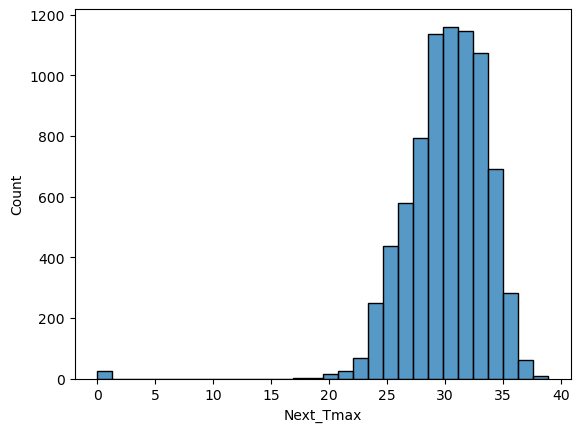

In [17]:
sns.histplot(x='Next_Tmax',data=df,bins=30)

<AxesSubplot:xlabel='Next_Tmin', ylabel='Count'>

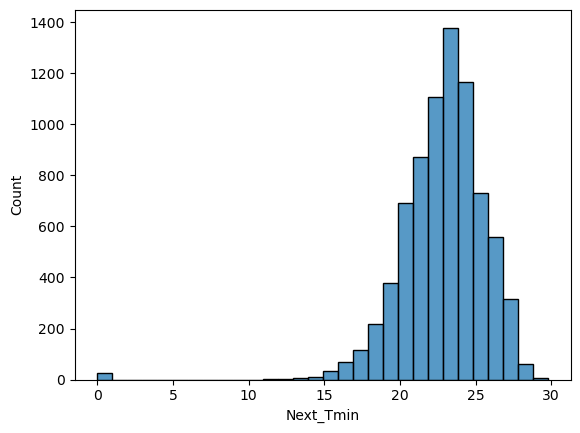

In [16]:
sns.histplot(x='Next_Tmin',data=df,bins=30)

In [18]:
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

31.4    112
29.4    111
29.1    108
29.7    107
31.9    105
       ... 
36.9      1
21.2      1
20.1      1
36.4      1
20.3      1
Name: Present_Tmax, Length: 168, dtype: int64


24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.6      1
14.2      1
29.1      1
29.7      1
15.0      1
Name: Present_Tmin, Length: 156, dtype: int64


0.000000     75
77.030350     2
98.524734     2
19.794666     2
51.810596     2
             ..
52.924568     1
60.215191     1
46.799820     1
52.227486     1
22.933014     1
Name: LDAPS_RHmin, Length: 7673, dtype: int64


0.000000      75
96.525200      2
99.251968      2
100.000153     2
94.795967      2
              ..
96.718201      1
94.153252      1
96.910126      1
93.541885      1
77.243744      1
Name: LDAPS_RHmax, Length: 7665, dtype: int64


0.000000     75
17.624954     2
38.542255     2
28.074101     1
33.291634     1
             ..
27.856410     1
26.984258     1
29.085588     1
28.209551     1
27.939516     1
Name:

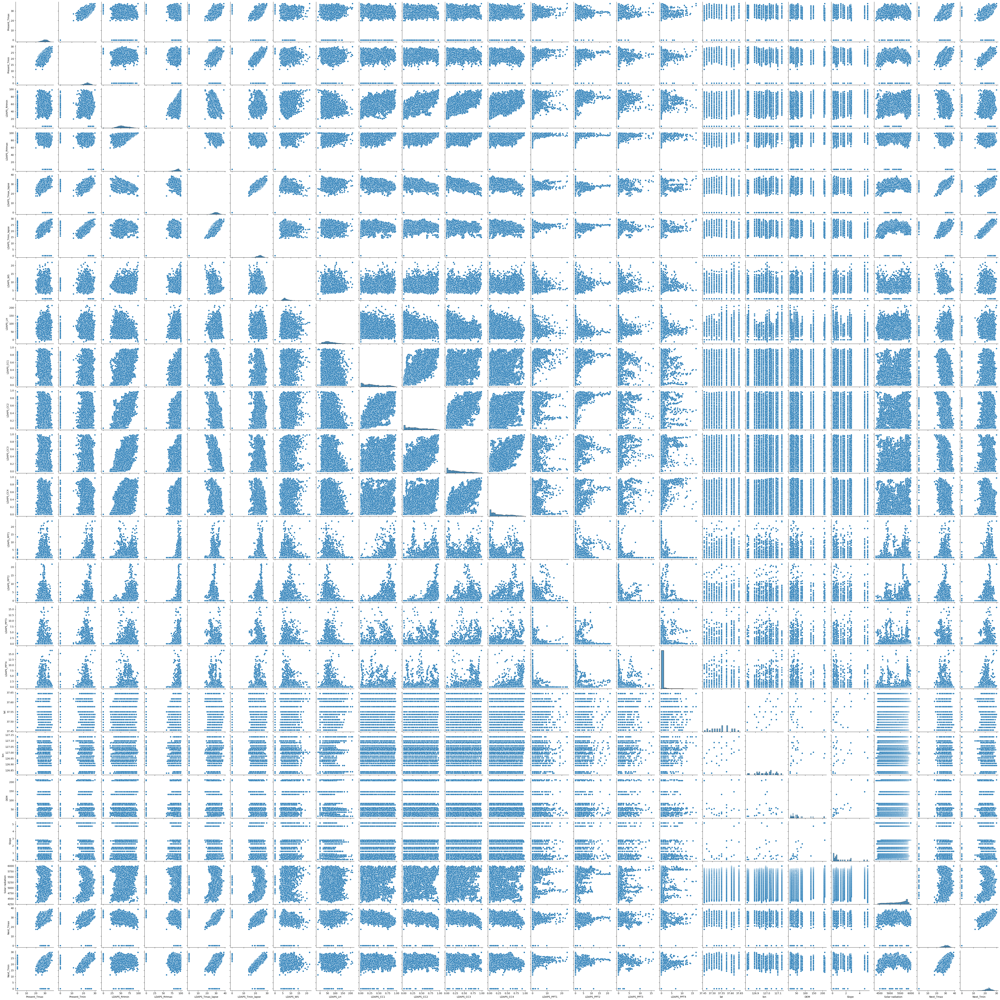

In [19]:
sns.pairplot(data=df,palette='Dark2')

array([[<AxesSubplot:title={'center':'Present_Tmax'}>,
        <AxesSubplot:title={'center':'Present_Tmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmax'}>,
        <AxesSubplot:title={'center':'LDAPS_Tmax_lapse'}>],
       [<AxesSubplot:title={'center':'LDAPS_Tmin_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_WS'}>,
        <AxesSubplot:title={'center':'LDAPS_LH'}>,
        <AxesSubplot:title={'center':'LDAPS_CC1'}>,
        <AxesSubplot:title={'center':'LDAPS_CC2'}>],
       [<AxesSubplot:title={'center':'LDAPS_CC3'}>,
        <AxesSubplot:title={'center':'LDAPS_CC4'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT1'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT2'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT3'}>],
       [<AxesSubplot:title={'center':'LDAPS_PPT4'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lon'}>,
        <AxesSubplot:title={'center':'DEM'}>,
 

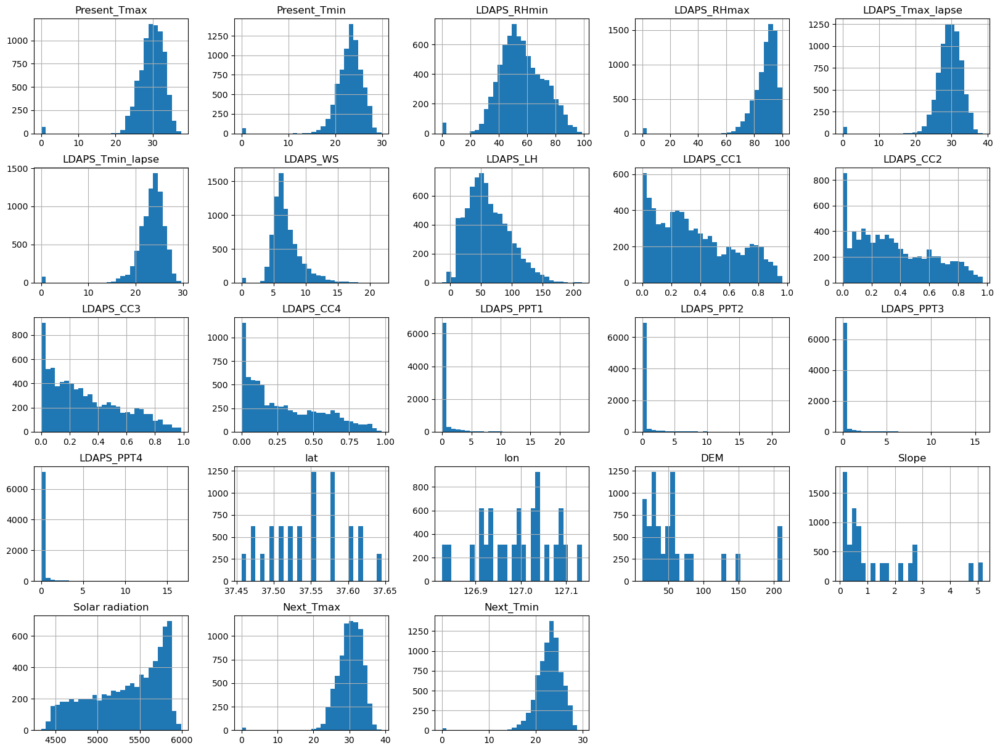

In [22]:
df.hist(figsize=(20,15),grid=True,bins=30)

In [23]:
df.skew()

Present_Tmax       -3.402987
Present_Tmin       -3.232442
LDAPS_RHmin        -0.113889
LDAPS_RHmax        -4.712138
LDAPS_Tmax_lapse   -3.457452
LDAPS_Tmin_lapse   -3.573353
LDAPS_WS            1.163684
LDAPS_LH            0.635208
LDAPS_CC1           0.460727
LDAPS_CC2           0.474379
LDAPS_CC3           0.643064
LDAPS_CC4           0.671739
LDAPS_PPT1          5.395178
LDAPS_PPT2          5.776835
LDAPS_PPT3          6.458608
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -2.213759
Next_Tmin          -2.049088
dtype: float64

In [24]:
df.columns

Index(['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [25]:
sk = ('LDAPS_WS', 'LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4', 'DEM','Slope')
for col in sk:
    if df.skew().loc[col]>0.55:
        df[col] = np.log1p(df[col])

In [26]:
df.skew()

Present_Tmax       -3.402987
Present_Tmin       -3.232442
LDAPS_RHmin        -0.113889
LDAPS_RHmax        -4.712138
LDAPS_Tmax_lapse   -3.457452
LDAPS_Tmin_lapse   -3.573353
LDAPS_WS           -2.199811
LDAPS_LH            0.635208
LDAPS_CC1           0.460727
LDAPS_CC2           0.474379
LDAPS_CC3           0.643064
LDAPS_CC4           0.671739
LDAPS_PPT1          2.766149
LDAPS_PPT2          3.195810
LDAPS_PPT3          4.014298
LDAPS_PPT4          4.230575
lat                 0.087062
lon                -0.285213
DEM                 0.443730
Slope               0.836131
Solar radiation    -0.511210
Next_Tmax          -2.213759
Next_Tmin          -2.049088
dtype: float64

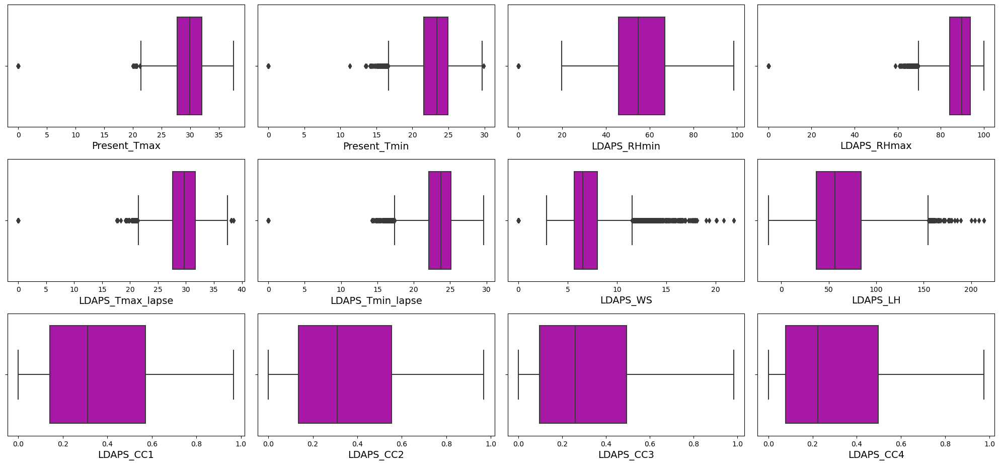

In [20]:
plt.figure(figsize=(20,15),facecolor='white')
plot = 1
for col in df.columns:
    if plot<=12:
        a = plt.subplot(5,4,plot)
        sns.boxplot(df[col],color='m')
        plt.xlabel(col,fontsize=14)
        plt.yticks(rotation=0,fontsize=10)
    plot+=1
plt.tight_layout()
        

In [27]:
# Remove outliers
# calculate zscore
from scipy.stats import zscore

zs=np.abs(zscore(df))
zs

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,0.195796,0.496132,0.130971,0.320347,0.303829,0.084866,0.051504,0.221336,0.497849,0.573957,...,0.373650,0.324265,0.303648,1.189286,0.005000,2.062296,1.308384,1.517935,0.297407,0.584517
1,0.587970,0.434705,0.252716,0.274775,0.127016,0.228786,0.442279,0.292012,0.529859,0.389214,...,0.373650,0.324265,0.303648,1.189286,0.511177,0.039294,0.509007,1.229950,0.091927,0.124643
2,0.514492,0.087431,0.481490,0.315859,0.185366,0.390672,0.237439,1.211307,0.591169,0.367227,...,0.373650,0.324265,0.303648,0.653021,0.838510,0.432635,0.863826,1.216534,0.258785,0.370606
3,0.612462,0.118145,0.129953,0.798413,0.091595,0.012530,0.462176,0.112166,0.564511,0.488652,...,0.373650,0.324265,0.303648,1.991696,0.385280,0.011139,1.172729,1.201176,0.425642,0.512106
4,0.465506,0.342563,0.002314,0.234730,0.051656,0.061436,0.421905,1.350178,0.810917,0.396068,...,0.373650,0.324265,0.303648,0.118743,1.807917,0.365426,0.520305,1.207205,0.286594,0.124643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,1.518401,1.816828,1.886896,0.770447,0.721441,1.375767,0.232690,0.297732,1.271272,1.048052,...,0.373650,0.324265,0.303648,0.149390,1.263971,1.424710,1.045312,2.093040,0.519884,1.681140
7748,1.518401,1.632545,2.059821,0.910722,0.561841,1.388629,0.062534,0.429652,1.249123,1.071485,...,0.373650,0.324265,0.303648,0.417522,1.037356,1.290913,0.933662,2.104553,0.436455,1.433516
7749,1.542893,1.724686,2.130742,0.915285,0.336468,1.452867,0.236837,1.547875,1.199513,1.129729,...,0.373650,0.324265,0.303648,0.417522,0.269384,1.129993,0.855696,2.074325,0.658931,1.928765
7750,2.326659,3.598231,2.331690,2.545926,2.837883,2.749583,2.169366,2.213017,1.385188,1.360750,...,0.373650,0.324265,0.303648,1.758184,2.082302,1.719105,1.145530,2.358212,3.551128,4.086637


In [28]:
thresholds = 3
print(np.where(zs<3))
print(df.shape)

(array([   0,    0,    0, ..., 7751, 7751, 7751], dtype=int64), array([ 0,  1,  2, ..., 20, 21, 22], dtype=int64))
(7752, 23)


In [29]:
df_new = df[(zs<3).all(axis=1)]

In [30]:
print(df.shape)
print(df_new.shape)

(7752, 23)
(6711, 23)


In [32]:
df = df_new
print('after removing outliers:',df.shape)

after removing outliers: (6711, 23)


# Data Distribution

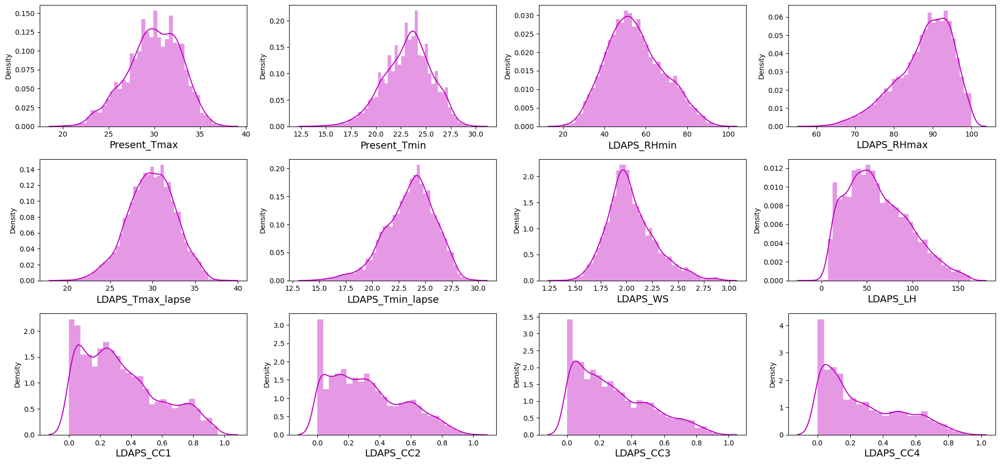

In [33]:
plt.figure(figsize=(20,15),facecolor='white')
plot = 1
for col in df.columns:
    if plot<=12:
        a = plt.subplot(5,4,plot)
        sns.distplot(df[col],color='m')
        plt.xlabel(col,fontsize=14)
        plt.yticks(rotation=0,fontsize=10)
    plot+=1
plt.tight_layout()

In [36]:
x = df.drop(['Next_Tmax','Next_Tmin'],axis=1)
y1 = df['Next_Tmax']
y2 = df['Next_Tmin']

In [46]:
from sklearn.preprocessing import StandardScaler

In [ ]:
def normalizer(x_train,x_test):
    scaler = Normalizer()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.fit_transform(x_test)
    return x_train,x_test

In [ ]:
def minmax(x_train,x_test):
    scaler = MinMaxScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.fit_transform(x_test)
    return x_train,x_test

In [37]:
def stdscaler(x_train,x_test):
    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.fit_transform(x_test)
    return x_train,x_test

In [65]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import plotly.express as px
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

In [67]:
def best_model(x,y,scaler,algo):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=42)
    x_train = np.asarray(x_train)
    x_test = np.asarray(x_test)
    x_train,x_test = scaler(x_train,x_test)
    model = algo()
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    mae = mean_absolute_error(pred,y_test)
    mse = mean_squared_error(pred,y_test)
    score = r2_score(y_test,pred)
    print('mean absolute error',mae)
    print('mean squared error',mse)
    print('score:',score)
    
    return pred,y_test,mse,mae,score

In [68]:
list_of_target = [y1,y2]
algo_list = [LinearRegression,KNeighborsRegressor,DecisionTreeRegressor,RandomForestRegressor,SVR]
list_of_MAE = []
list_of_MSE = []
list_of_score = []
for i in algo_list:
    print(i)
    pred,y_test,mse,mae,score = best_model(x,y1,stdscaler,i)
    list_of_MAE.append(mae)
    list_of_MSE.append(mse)
    list_of_score.append(score)

<class 'sklearn.linear_model._base.LinearRegression'>
mean absolute error 1.0773148552660676
mean squared error 2.018626925830702
score: 0.764878099697448
<class 'sklearn.neighbors._regression.KNeighborsRegressor'>
mean absolute error 0.8314064362336117
mean squared error 1.2518362336114426
score: 0.8541909303061596
<class 'sklearn.tree._classes.DecisionTreeRegressor'>
mean absolute error 1.0728247914183553
mean squared error 2.3023837902264606
score: 0.7318271915148136
<class 'sklearn.ensemble._forest.RandomForestRegressor'>
mean absolute error 0.7466924910607867
mean squared error 1.0280171072705604
score: 0.8802605212919575
<class 'sklearn.svm._classes.SVR'>
mean absolute error 0.7947391918447683
mean squared error 1.204610367032174
score: 0.859691617605762


In [69]:
list_of_target = [y1,y2]
algo_list = [LinearRegression,KNeighborsRegressor,DecisionTreeRegressor,RandomForestRegressor,SVR]
list_of_MAE = []
list_of_MSE = []
list_of_score = []

for i in algo_list:
    print(i)
    pred,y_test,mse,mae,score = best_model(x,y2,stdscaler,i)
    list_of_MAE.append(mae)
    list_of_MSE.append(mse)
    list_of_score.append(score)    

<class 'sklearn.linear_model._base.LinearRegression'>
mean absolute error 0.7944404292647009
mean squared error 1.0469653663059175
score: 0.8191712156224404
<class 'sklearn.neighbors._regression.KNeighborsRegressor'>
mean absolute error 0.6528367103694875
mean squared error 0.7172259833134683
score: 0.8761228338009053
<class 'sklearn.tree._classes.DecisionTreeRegressor'>
mean absolute error 0.8755661501787843
mean squared error 1.375792610250298
score: 0.7623771394224917
<class 'sklearn.ensemble._forest.RandomForestRegressor'>
mean absolute error 0.6145262216924913
mean squared error 0.642755107866508
score: 0.8889852247758055
<class 'sklearn.svm._classes.SVR'>
mean absolute error 0.5750566514913916
mean squared error 0.5772821558241472
score: 0.900293520836452
